<a href="https://colab.research.google.com/github/atc00009/DeepLearning-AthiraChitrapal/blob/main/Task_A.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
from skimage import io,img_as_float
import matplotlib.pyplot as plt
import numpy as np
import cv2
import os
import tensorflow as tf
import pandas as pd
import scipy

In [3]:
path= '/content/drive/MyDrive/New folder/Tsk A/original'
original=[]

for img in os.listdir(path):
  image_path=path+"/"+img
  img_arr=cv2.imread(image_path)
  img_arr=cv2.resize(img_arr,(224,224))
  original.append(img_arr)

In [4]:
original=np.array(original)/255
original=original.astype('float32')

In [5]:
noise_factor = 0.1
noisy = original + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=original.shape)

In [6]:
noisy = np.clip(noisy, 0., 1.) 

In [7]:
print(noisy[1].shape)

(224, 224, 3)


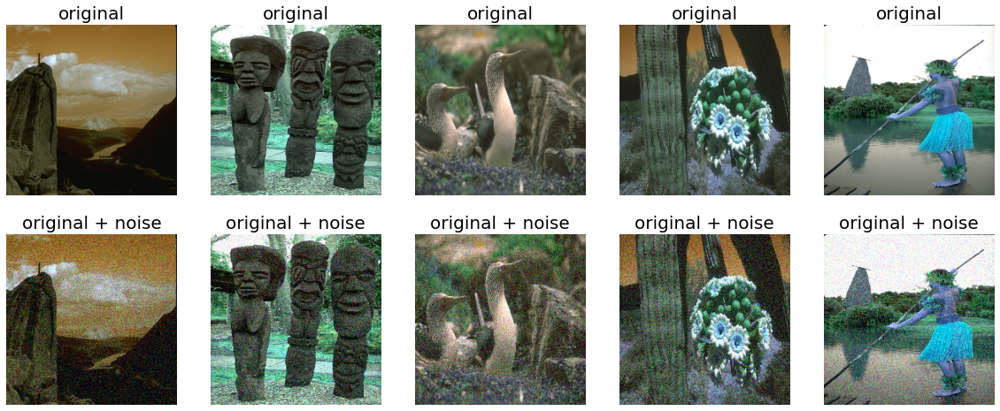

In [8]:
n = 5
plt.figure(figsize=(20, 8))
plt.gray()
for i in range(n):
  ax = plt.subplot(2, n, i + 1) 
  plt.title("original", size=20) 
  plt.axis("off") 
  plt.imshow(tf.squeeze(original[i])) 
  plt.gray() 
  bx = plt.subplot(2, n, n+ i + 1) 
  plt.title("original + noise", size=20)
  plt.axis("off") 
  plt.imshow(tf.squeeze(noisy[i])) 
plt.show()

In [9]:
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import mean_squared_error
def get_measurement(original, to_compare):
  mse_score = mean_squared_error(original, to_compare)
  ssim_score, diff = ssim(original, to_compare, multichannel=True, full=True)
  return mse_score, round(ssim_score, 3)



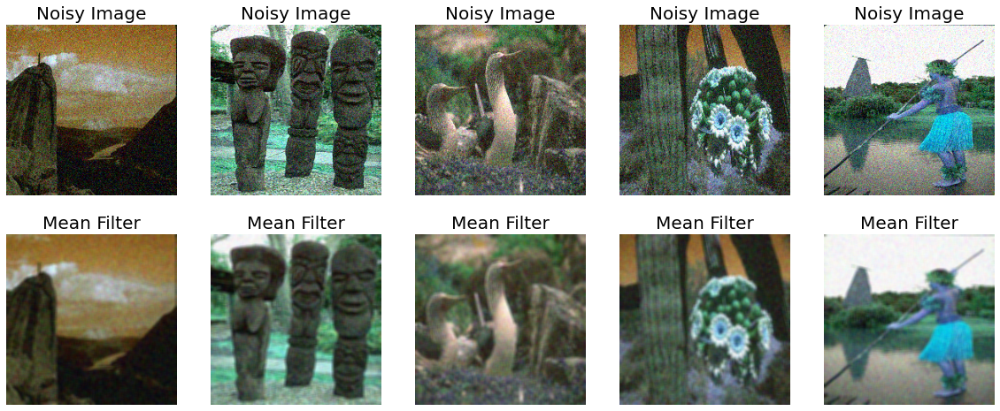

In [10]:
n = 5
plt.figure(figsize=(20, 8))
plt.gray()
for i in range(n):
  
  ax = plt.subplot(2, n, i + 1) 
  plt.title("Noisy Image", size=20) 
  plt.axis("off") 
  plt.imshow(tf.squeeze(noisy[i])) 
  plt.gray() 
  bx = plt.subplot(2, n, n+ i + 1) 
  plt.title("Mean Filter", size=20)
  plt.axis("off") 
  plt.imshow(cv2.blur(noisy[i],(5,5)))
plt.show()

In [11]:
mean=cv2.blur(noisy[3],(5,5))

In [12]:
mean_mse,mean_ssim=get_measurement(original[3],mean )

noise_measure = [[mean_mse,mean_ssim]]
pd.DataFrame(noise_measure, columns=['MSE', 'SSIM'])

/usr/local/lib/python3.7/dist-packages/skimage/metrics/_structural_similarity.py:108: UserWarning: Inputs have mismatched dtype.  Setting data_range based on im1.dtype.
  im2[..., ch], **args)


,MSE,SSIM
0,0.004997,0.731


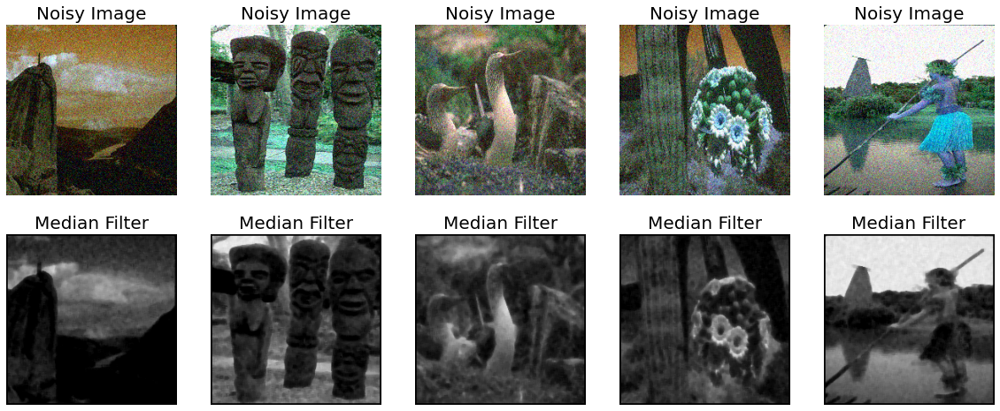

In [13]:

n = 5
plt.figure(figsize=(20, 8))
plt.gray()
for i in range(n):
  
  ax = plt.subplot(2, n, i + 1) 
  plt.title("Noisy Image", size=20) 
  plt.axis("off") 
  plt.imshow(tf.squeeze(noisy[i])) 
  plt.gray() 
  bx = plt.subplot(2, n, n+ i + 1) 
  plt.title("Median Filter", size=20)
  plt.axis("off") 
  plt.imshow(scipy.signal.medfilt(noisy[i],5))
plt.show()

In [14]:
test_median=scipy.signal.medfilt(noisy[1],5)
median_mse,median_ssim=get_measurement(original[1], test_median)

noise_measure = [[median_mse,median_ssim]]
pd.DataFrame(noise_measure, columns=['MSE', 'SSIM'])

/usr/local/lib/python3.7/dist-packages/skimage/metrics/_structural_similarity.py:108: UserWarning: Inputs have mismatched dtype.  Setting data_range based on im1.dtype.
  im2[..., ch], **args)


,MSE,SSIM
0,0.041966,0.462


In [15]:
from skimage.restoration import denoise_wavelet

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


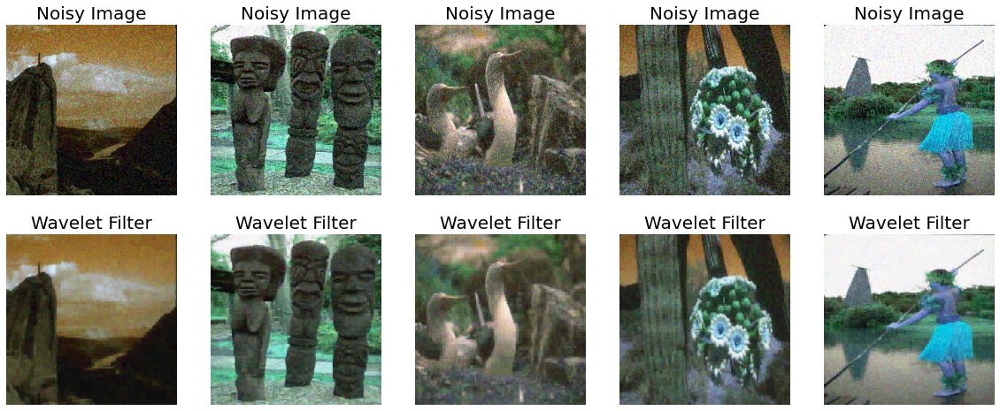

In [16]:
n = 5
plt.figure(figsize=(20, 8))
plt.gray()
for i in range(n):
  
  ax = plt.subplot(2, n, i + 1) 
  plt.title("Noisy Image", size=20) 
  plt.axis("off") 
  plt.imshow(tf.squeeze(noisy[i])) 
  plt.gray() 
  bx = plt.subplot(2, n, n+ i + 1) 
  plt.title("Wavelet Filter", size=20)
  plt.axis("off") 
  plt.imshow(denoise_wavelet(noisy[i], multichannel=True, rescale_sigma=True)) 
plt.show()

In [17]:
test_wavelet=denoise_wavelet(noisy[1], multichannel=True, rescale_sigma=True)
median_mse,median_ssim=get_measurement(original[1], test_wavelet)

noise_measure = [[median_mse,median_ssim]]
pd.DataFrame(noise_measure, columns=['MSE', 'SSIM'])

/usr/local/lib/python3.7/dist-packages/skimage/metrics/_structural_similarity.py:108: UserWarning: Inputs have mismatched dtype.  Setting data_range based on im1.dtype.
  im2[..., ch], **args)


,MSE,SSIM
0,0.004441,0.75


In [18]:
!git clone https://github.com/soumik12345/MIRNet
%cd MIRNet

Cloning into 'MIRNet'...
remote: Enumerating objects: 251, done.
remote: Counting objects: 100% (251/251), done.
remote: Compressing objects: 100% (195/195), done.
remote: Total 251 (delta 114), reused 166 (delta 45), pack-reused 0
Receiving objects: 100% (251/251), 28.13 MiB | 15.77 MiB/s, done.
Resolving deltas: 100% (114/114), done.
/content/MIRNet


In [19]:
!pip install -q wandb


     |████████████████████████████████| 1.8 MB 4.9 MB/s 
     |████████████████████████████████| 144 kB 66.9 MB/s 
     |████████████████████████████████| 181 kB 53.3 MB/s 
     |████████████████████████████████| 63 kB 1.4 MB/s 


In [20]:
from glob import glob
from PIL import Image
from matplotlib import pyplot as plt
from mirnet.inference import Inferer
from mirnet.utils import download_dataset, plot_result

import tensorflow as tf
import numpy as np


In [21]:
inferer = Inferer()
inferer.download_weights('1UCW9uBMBsd9EiK68nN_6ZlsEJE3kRD3m')
inferer.build_model(
    num_rrg=3, num_mrb=2, channels=64,
    weights_path='/content/drive/MyDrive/New folder/Tsk A/low_light_weights_best.h5'
)


Access denied with the following error:



 	Cannot retrieve the public link of the file. You may need to change
	the permission to 'Anyone with the link', or have had many accesses. 

You may still be able to access the file from the browser:

	 https://drive.google.com/uc?id=1UCW9uBMBsd9EiK68nN_6ZlsEJE3kRD3m 



In [22]:
#dot_img_file_path = "/tmp/model.png"
#tf.keras.utils.plot_model(inferer.model, to_file = dot_img_file_path, show_shapes=True)

In [23]:
IMG_SIZE = 400
train_path= '/content/drive/MyDrive/New folder/Tsk A/original'
Noise="/content/drive/MyDrive/New folder/Tsk A/noisy50"

In [24]:
x_train=[]

for img in os.listdir(train_path):
  image_path=train_path+"/"+img
  img_arr=cv2.imread(image_path)
  img_arr=cv2.resize(img_arr,(224,224))
  img_arr=np.array(img_arr)/255
  img_arr=img_arr.astype('float32')
  noise_factor = 0.1
  noisy = img_arr + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=img_arr.shape)
  noisy = np.clip(noisy, 0., 1.) 
  noisy = noisy*255
  cv2.imwrite(Noise+img,noisy)


In [52]:
test_data= glob('/content/drive/MyDrive/New folder/Tsk A/noisy50*.*')

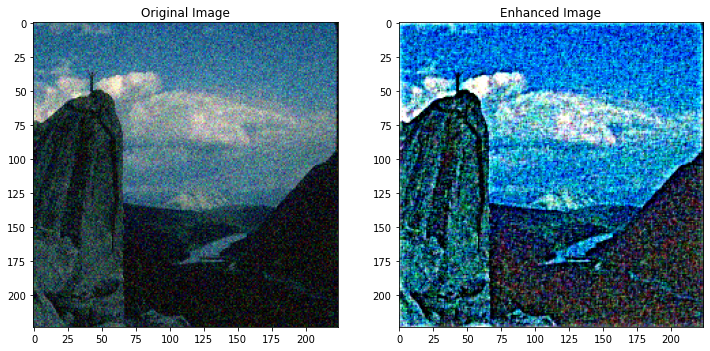

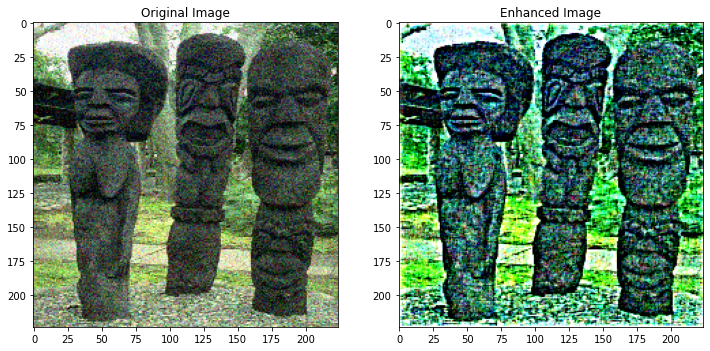

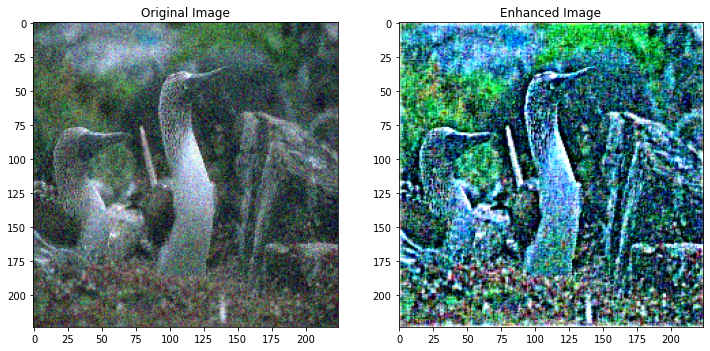

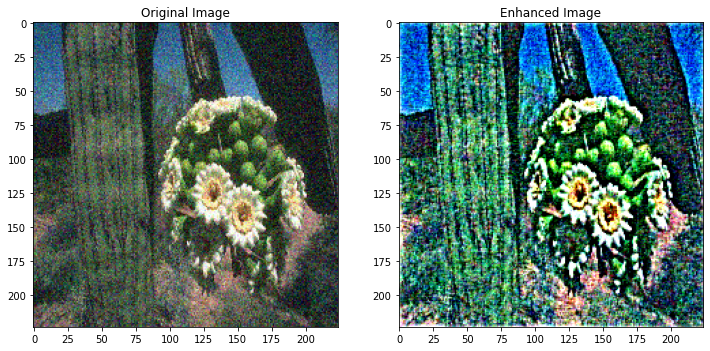

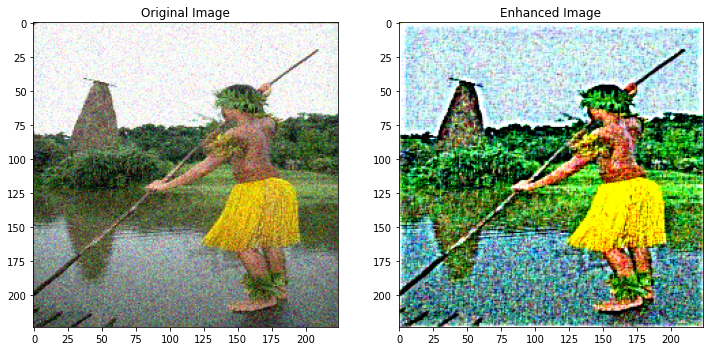

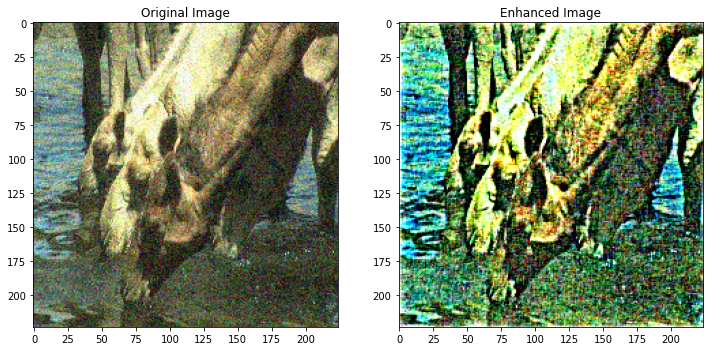

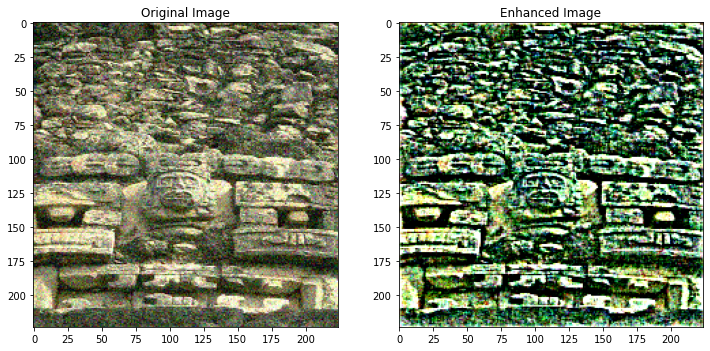

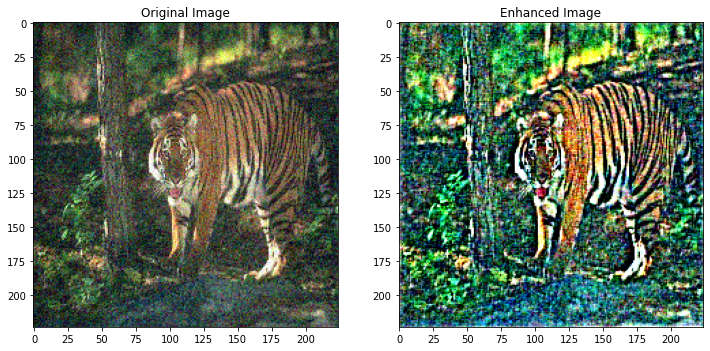

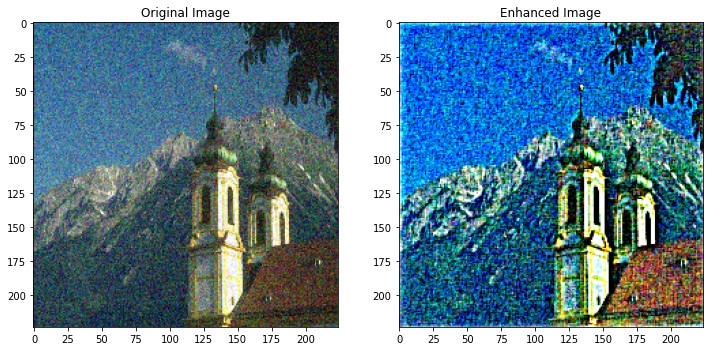

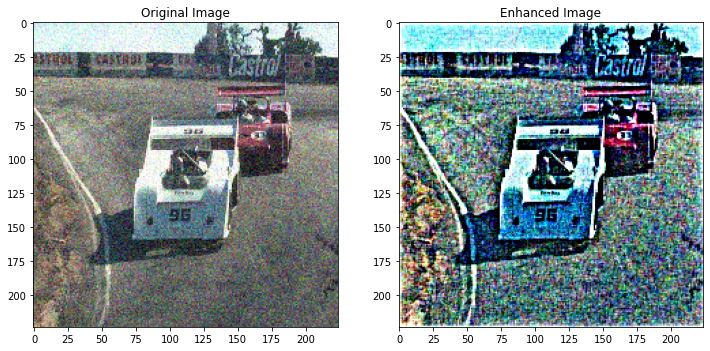

In [53]:
IMG_SIZE = 400
for image_path in test_data[:10]:
    original_image, output_image = inferer.infer(image_path)
    plot_result(original_image, output_image)


In [55]:
print (original_image)

<PIL.PngImagePlugin.PngImageFile image mode=RGB size=224x224 at 0x7FC6C8808190>


In [54]:
print (output_image)

<PIL.Image.Image image mode=RGB size=224x224 at 0x7FC6C882C190>


In [56]:
src = np.array(original_image)

In [57]:
dst= np.array(output_image)

In [58]:
DL_mse,DL_ssim=get_measurement(src, dst)

noise_measure = [[DL_mse,DL_ssim]]
pd.DataFrame(noise_measure, columns=['MSE', 'SSIM'])

,MSE,SSIM
0,2522.549665,0.652
